In [1]:
import plotly
from plotly.graph_objs import Scatter, Layout
import pandas as pd
import numpy as np
import locale
locale.setlocale(locale.LC_ALL, '')
from plotly.graph_objs import *
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-whitegrid')
import warnings
warnings.filterwarnings('ignore')

<h1><center>Supplemental Figures</center></h1><h2><center>for "Predicting property damage from tornadoes with zero-inflated neural networks"</center></h2>

In [2]:
plotly.offline.init_notebook_mode(connected=True)

In [3]:
unproc_tor_df = pd.read_csv("/home/jeremy/tornadoesr/data/raw/tor_data_inflation_adj.csv")

In [4]:
mean_lat = np.mean(unproc_tor_df['BEGIN_LAT'])
stand_dev_lat = np.std(unproc_tor_df['BEGIN_LAT'])

mean_lon = np.mean(unproc_tor_df['BEGIN_LON'])
stand_dev_lon = np.std(unproc_tor_df['BEGIN_LON'])

mean_log_dam = np.mean(np.log(unproc_tor_df['DAMAGE_PROPERTY'] + 1))
stand_dev_log_dam = np.std(np.log(unproc_tor_df['DAMAGE_PROPERTY'] + 1))

In [5]:
test_set = pd.read_csv("/home/jeremy/tornadoesr/data/raw/final_test_set_perf.csv")

In [6]:
test_set['natural_scale_true'] = np.exp(test_set['true'] * stand_dev_log_dam + mean_log_dam) - 1

test_set['natural_scale_pred'] = np.exp(test_set['pred'] * stand_dev_log_dam + mean_log_dam) - 1

test_set['natural_scale_resid'] = test_set['natural_scale_pred'] - test_set['natural_scale_true']

test_set['BEGIN_LAT'] = (test_set['lat'] * stand_dev_lat) + mean_lat

test_set['BEGIN_LON'] = (test_set['lon'] * stand_dev_lon) + mean_lon

In [7]:
sign_list = []

for i in range(len(test_set)):
    
    if test_set['natural_scale_resid'][i] > 0:
        sign_list.append(1)
        
    else:
        sign_list.append(-1)
    
test_set['natural_resid_sign'] = sign_list

test_set['log_10_abs_resid'] = np.log10(abs(test_set['natural_scale_resid']))

test_set['log_10_resid_direction'] = test_set['natural_resid_sign'] * test_set['log_10_abs_resid']

In [8]:
labels = []

for i in range(len(test_set['natural_scale_resid'])):
    
    intermediate = locale.format("%d", test_set["natural_scale_resid"][i], grouping = True)
    
    labels.append(intermediate)

resid_str_list = np.repeat('<br><br>Residual: ', len(test_set))

true_str_list = np.repeat('<br>True Damage: ', len(test_set))

exp_str_list = np.repeat('Predicted Damage: ', len(test_set))


labels_better = []

for i in range(len(test_set)):
    
    intermediate_one = locale.format("%d", test_set["natural_scale_true"][i], grouping = True)
    
    intermediate_one = "$" + intermediate_one
    
    intermediate_two = locale.format("%d", test_set["natural_scale_pred"][i], grouping = True)
    
    intermediate_two = "$" + intermediate_two
    
    intermediate_comb = exp_str_list[i] + intermediate_two + true_str_list[i] + intermediate_one + resid_str_list[i] + labels[i]
    
    labels_better.append(intermediate_comb)

In [9]:
cities_df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')

cities_df = cities_df[cities_df['pop'] > 100000]

In [10]:
cities_df['pop'] = cities_df.apply(lambda x: "{:,}".format(x['pop']), axis=1)

city_labels = "Name: " + cities_df['name'] + "<br>Population: " + cities_df['pop']

### 1. Conditional Damage Residual Map

Interactive geographic display of model performance on the test set data for the best model predicting property damage conditional on non-zero damage. Darker blues indicate larger overestimates, while darker reds indicate larger underestimates; lighter colors indicate predictions that closely match observed property damages. On mouse hover, points display the observed property damage value, predicted property damage value, and the residual. Highly populated cities are displayed for geographic context.

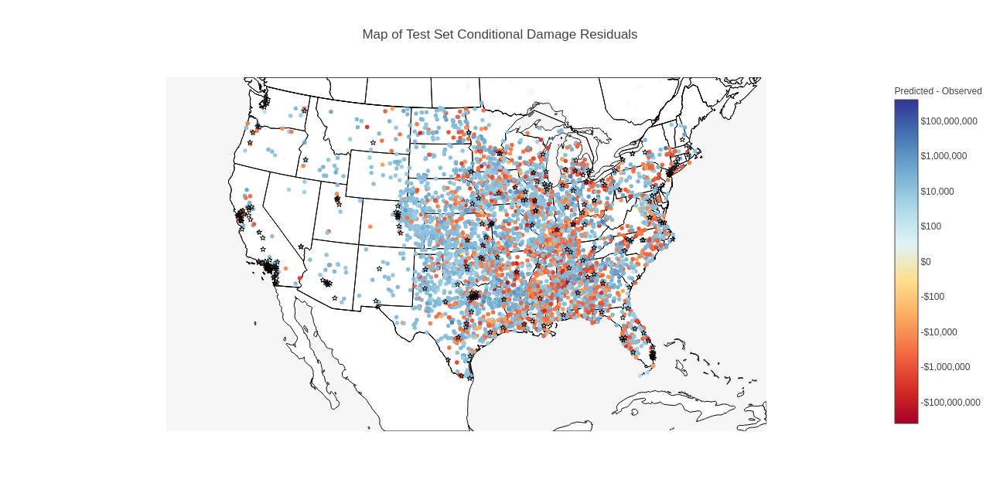

In [11]:
trace1 = {"lon": test_set["BEGIN_LON"],
          "lat":  test_set["BEGIN_LAT"],
          "name": "Residual",
          "text": labels_better,
          "marker": {"color": test_set["log_10_resid_direction"],
                     "colorscale": [[0.0, 'rgb(165,0,38)'],
                                         [0.1111111111111111, 'rgb(215,48,39)'],
                                         [0.2222222222222222, 'rgb(244,109,67)'],
                                         [0.3333333333333333, 'rgb(253,174,97)'],
                                         [0.4444444444444444, 'rgb(254,224,144)'],
                                         [0.5555555555555556, 'rgb(224,243,248)'],
                                         [0.6666666666666666, 'rgb(171,217,233)'],
                                         [0.7777777777777778, 'rgb(116,173,209)'],
                                         [0.8888888888888888, 'rgb(69,117,180)'],
                                         [1.0, 'rgb(49,54,149)']],
                     "size": 5.5,
                     "cmin": test_set['log_10_resid_direction'].min(),
                     "cmax": -test_set['log_10_resid_direction'].min(),
                     "colorbar": dict(title = 'Predicted - Observed',
                                      tickmode = 'array',
                                      tickvals = [-8, -6, -4, -2,
                                                  0,
                                                  2, 4, 6, 8],
                                      ticktext = ['-$100,000,000', '-$1,000,000', '-$10,000', '-$100',
                                                  '$0', '$100', '$10,000', '$1,000,000', '$100,000,000'])},
          "type": "scattergeo", 
          "visible": True}

trace2 = {"lon": cities_df["lon"],
          "lat":  cities_df["lat"],
          "name": "City",
          "text": city_labels,
          "marker": {"size": 5,
                     "symbol": "star-open",
                     "color": "black"},
          "type": "scattergeo"}

data = Data([trace1, trace2])

layout = dict(geo = dict(scope = 'north america',
                         showland = True,
                         landcolor = "rgb(255, 255, 255)",
                         subunitcolor = "rgb(0, 0, 0)",
                         countrycolor = "rgb(0, 0, 0)",
                         showlakes = True,
                         showocean = True,
                         lakecolor = "rgb(247, 247, 247)",
                         oceancolor = "rgb(247, 247, 247)",
                         showsubunits = True,
                         showcountries = True,
                         resolution = 50,
                         lonaxis = dict(showgrid = True,
                                        gridwidth = 0.05,
                                        range= [-125.0, -70.0],
                                        dtick = 5),
                         lataxis = dict(showgrid = True,
                                        gridwidth = 0.05,
                                        range= [23.0, 50.0],
                                        dtick = 5)),
              title = 'Map of Test Set Conditional Damage Residuals',
              showlegend = False,
              autosize = False,
              width = 1100*3/4, height = 850*3/4)

fig1 = {'data':data,
       'layout':layout}

plotly.offline.iplot(fig1)

In [12]:
test_set['binary_resid'] = test_set['probs'] - test_set['dam_ind']

In [13]:
resid_str_list = np.repeat('<br><br>Residual: ', len(test_set))

true_str_list = np.repeat('<br>Damage Indicator: ', len(test_set))

exp_str_list = np.repeat('Predicted Probability: ', len(test_set))


labels_better = []

for i in range(len(test_set)):
    
    intermediate_comb = (exp_str_list[i] + str(np.round(test_set['probs'][i], 3)) +
                         true_str_list[i] + str(test_set['dam_ind'][i]) +
                         resid_str_list[i] + str(np.round(test_set['binary_resid'][i], 3)))
    
    labels_better.append(intermediate_comb)

### 2. Damage Occurrence Residual Map

Interactive geographic display of model performance on the test set data for the best model predicting whether property damage will occur. Darker blues indicate high predicted probabilities of damage for non-damaging tornadoes, while darker reds indicate low predicted probabilities of damage for damaging tornadoes; lighter colors indicate high predicted probabilities for damaging tornadoes or low predicted probabilities for non-damaging tornadoes. On mouse hover, points display the damage indicator (1 = damaging, 0 = non-damaging), predicted probability of damage, and the residual. Highly populated cities are displayed for geographic context.

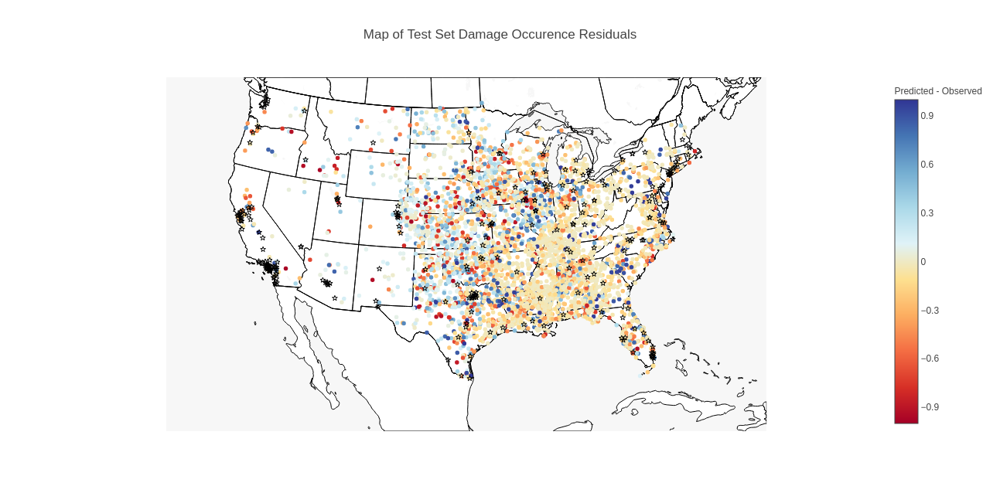

In [14]:
trace1 = {"lon": test_set["BEGIN_LON"],
          "lat":  test_set["BEGIN_LAT"],
          "name": "Residual",
          "text": labels_better,
          "marker": {"color": test_set["binary_resid"],
                     "colorscale": [[0.0, 'rgb(165,0,38)'],
                                         [0.1111111111111111, 'rgb(215,48,39)'],
                                         [0.2222222222222222, 'rgb(244,109,67)'],
                                         [0.3333333333333333, 'rgb(253,174,97)'],
                                         [0.4444444444444444, 'rgb(254,224,144)'],
                                         [0.5555555555555556, 'rgb(224,243,248)'],
                                         [0.6666666666666666, 'rgb(171,217,233)'],
                                         [0.7777777777777778, 'rgb(116,173,209)'],
                                         [0.8888888888888888, 'rgb(69,117,180)'],
                                         [1.0, 'rgb(49,54,149)']],
                     "size": 5.5,
                     "cmin": -1,
                     "cmax": 1,
                     "colorbar": dict(title = 'Predicted - Observed',
                                      tickvals = [-0.9, -0.6, -0.3, 0, 0.3, 0.6, 0.9])},
          "type": "scattergeo", 
          "visible": True}

trace2 = {"lon": cities_df["lon"],
          "lat":  cities_df["lat"],
          "name": "City",
          "text": city_labels,
          "marker": {"size": 5,
                     "symbol": "star-open",
                     "color": "black"},
          "type": "scattergeo"}

data = Data([trace1, trace2])

layout = dict(geo = dict(scope = 'north america',
                         showland = True,
                         landcolor = "rgb(255, 255, 255)",
                         subunitcolor = "rgb(0, 0, 0)",
                         countrycolor = "rgb(0, 0, 0)",
                         showlakes = True,
                         showocean = True,
                         lakecolor = "rgb(247, 247, 247)",
                         oceancolor = "rgb(247, 247, 247)",
                         showsubunits = True,
                         showcountries = True,
                         resolution = 50,
                         lonaxis = dict(showgrid = True,
                                        gridwidth = 0.05,
                                        range= [-125.0, -70.0],
                                        dtick = 5),
                         lataxis = dict(showgrid = True,
                                        gridwidth = 0.05,
                                        range= [23.0, 50.0],
                                        dtick = 5)),
              title = 'Map of Test Set Damage Occurence Residuals',
              showlegend = False,
              autosize = False,
              width = 1100*3/4, height = 850*3/4)

fig1 = {'data':data,
       'layout':layout}

plotly.offline.iplot(fig1)

In [15]:
grid_pred_val_2019 = pd.read_csv("/home/jeremy/tornadoesr/data/raw/grid_with_predictions.csv")

cities_pred_val_2019 = pd.read_csv("/home/jeremy/tornadoesr/data/raw/cities_with_predictions.csv")

In [16]:
grid_pred_val_2019['log_10_dam'] = np.log10(grid_pred_val_2019['DAMAGE_PROPERTY'] + 1)

grid_pred_val_2019['BEGIN_LAT'] = (grid_pred_val_2019['BEGIN_LAT'] * stand_dev_lat) + mean_lat

grid_pred_val_2019['BEGIN_LON'] = (grid_pred_val_2019['BEGIN_LON'] * stand_dev_lon) + mean_lon


cities_pred_val_2019['log_10_dam'] = np.log10(cities_pred_val_2019['DAMAGE_PROPERTY'] + 1)

cities_pred_val_2019['BEGIN_LAT'] = (cities_pred_val_2019['BEGIN_LAT'] * stand_dev_lat) + mean_lat

cities_pred_val_2019['BEGIN_LON'] = (cities_pred_val_2019['BEGIN_LON'] * stand_dev_lon) + mean_lon

In [17]:
# For the grid
labels2 = []

for i in range(len(grid_pred_val_2019['DAMAGE_PROPERTY'])):
    
    intermediate = locale.format("%d", grid_pred_val_2019["DAMAGE_PROPERTY"][i], grouping = True)
    
    intermediate = "$" + intermediate
    
    labels2.append(intermediate)
    
grid_pred_val_2019['labels'] = labels2


# For the cities
labels3 = []

for i in range(len(cities_pred_val_2019['DAMAGE_PROPERTY'])):
    
    intermediate = locale.format("%d", cities_pred_val_2019["DAMAGE_PROPERTY"][i], grouping = True)
    
    intermediate = ("$" + intermediate)
    
    labels3.append(intermediate)
    
cities_pred_val_2019['labels'] = labels3

In [18]:
grid_pred_val_2019['DAMAGE_PROB'] = np.round(grid_pred_val_2019['DAMAGE_PROB'], 3)
cities_pred_val_2019['DAMAGE_PROB'] = np.round(cities_pred_val_2019['DAMAGE_PROB'], 3)

In [19]:
grid_jan_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 15]
grid_feb_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 46]
grid_mar_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 74]
grid_apr_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 105]
grid_may_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 135]
grid_jun_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 166]
grid_jul_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 196]
grid_aug_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 227]
grid_sep_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 258]
grid_oct_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 288]
grid_nov_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 319]
grid_dec_data = grid_pred_val_2019[grid_pred_val_2019['JULIAN_DAY'] == 349]

cities_jan_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 15]
cities_feb_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 46]
cities_mar_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 74]
cities_apr_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 105]
cities_may_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 135]
cities_jun_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 166]
cities_jul_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 196]
cities_aug_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 227]
cities_sep_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 258]
cities_oct_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 288]
cities_nov_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 319]
cities_dec_data = cities_pred_val_2019[cities_pred_val_2019['JULIAN_DAY'] == 349]

### 3. 2019 predicted conditional damage map

Interactive geographic display of model predictions on a regularly spaced grid for the best model predicting property damage conditional on non-zero damage. Darker purples indicate larger property damage predictions, while lighter yellows indicate smaller property damage predictions. On mouse hover, points display their coordinates along with predicted property damage value. Highly populated cities are displayed for geographic context and are accompanied by predicted property damage values. Interactive buttons along the left side allow the user to choose their 2019 month of interest.

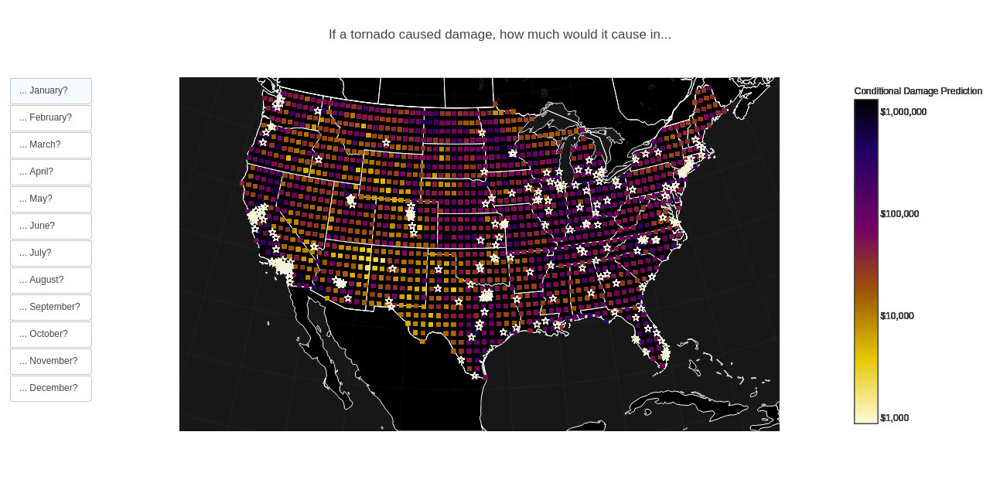

In [20]:
# Each trace can be thought of as a layer to the map
# trace1-12 are monthly data points
trace1 = {"lon": grid_jan_data["BEGIN_LON"],
          "lat":  grid_jan_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jan_data["labels"],
          "marker": {"color": grid_jan_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace2 = {"lon": grid_feb_data["BEGIN_LON"],
          "lat":  grid_feb_data["BEGIN_LAT"], 
          "name": "Grid Point",
          "text": grid_feb_data["labels"],
          "marker": {"color": grid_feb_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace3 = {"lon": grid_mar_data["BEGIN_LON"],
          "lat":  grid_mar_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_mar_data["labels"],
          "marker": {"color": grid_mar_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace4 = {"lon": grid_apr_data["BEGIN_LON"],
          "lat":  grid_apr_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_apr_data["labels"],
          "marker": {"color": grid_apr_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace5 = {"lon": grid_may_data["BEGIN_LON"],
          "lat":  grid_may_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_may_data["labels"],
          "marker": {"color": grid_may_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace6 = {"lon": grid_jun_data["BEGIN_LON"],
          "lat":  grid_jun_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jun_data["labels"],
          "marker": {"color": grid_jun_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace7 = {"lon": grid_jul_data["BEGIN_LON"],
          "lat":  grid_jul_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jul_data["labels"],
          "marker": {"color": grid_jul_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace8 = {"lon": grid_aug_data["BEGIN_LON"],
          "lat":  grid_aug_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_aug_data["labels"], 
          "marker": {"color": grid_aug_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace9 = {"lon": grid_sep_data["BEGIN_LON"],
          "lat":  grid_sep_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_sep_data["labels"],
          "marker": {"color": grid_sep_data["log_10_dam"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['log_10_dam'].min(),
                     "cmax": grid_pred_val_2019['log_10_dam'].max(),
                     "colorbar": dict(title = 'Conditional Damage Prediction',
                                      tickmode = 'array',
                                      tickvals = [3, 4, 5, 6],
                                      ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
          "type": "scattergeo", 
          "visible": True}
trace10 = {"lon": grid_oct_data["BEGIN_LON"],
           "lat":  grid_oct_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_oct_data["labels"],
           "marker": {"color": grid_oct_data["log_10_dam"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['log_10_dam'].min(),
                      "cmax": grid_pred_val_2019['log_10_dam'].max(),
                      "colorbar": dict(title = 'Conditional Damage Prediction',
                                       tickmode = 'array',
                                       tickvals = [3, 4, 5, 6],
                                       ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
           "type": "scattergeo", 
           "visible": True}
trace11 = {"lon": grid_nov_data["BEGIN_LON"],
           "lat":  grid_nov_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_nov_data["labels"],
           "marker": {"color": grid_nov_data["log_10_dam"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['log_10_dam'].min(),
                      "cmax": grid_pred_val_2019['log_10_dam'].max(),
                      "colorbar": dict(title = 'Conditional Damage Prediction',
                                       tickmode = 'array',
                                       tickvals = [3, 4, 5, 6, ],
                                       ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
           "type": "scattergeo", 
           "visible": True}
trace12 = {"lon": grid_dec_data["BEGIN_LON"],
           "lat":  grid_dec_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_dec_data["labels"],
           "marker": {"color": grid_dec_data["log_10_dam"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['log_10_dam'].min(),
                      "cmax": grid_pred_val_2019['log_10_dam'].max(),
                      "colorbar": dict(title = 'Conditional Damage Prediction',
                                       tickmode = 'array',
                                       tickvals = [3, 4, 5, 6],
                                       ticktext = ['$1,000', '$10,000', '$100,000', '$1,000,000'])},
           "type": "scattergeo", 
           "visible": True}


# trace13-24 are identical and are the cities
# They are repeated so that they can be redrawn for each dropdown selection
# Otherwise they become background to the prediction points
# And therefore less visible
trace13 = {"lon": cities_jan_data["BEGIN_LON"],
           "lat": cities_jan_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jan_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace14 = {"lon": cities_feb_data["BEGIN_LON"],
           "lat": cities_feb_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_feb_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace15 = {"lon": cities_mar_data["BEGIN_LON"],
           "lat": cities_mar_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_mar_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace16 = {"lon": cities_apr_data["BEGIN_LON"],
           "lat": cities_apr_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_apr_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace17 = {"lon": cities_may_data["BEGIN_LON"],
           "lat": cities_may_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_may_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace18 = {"lon": cities_jun_data["BEGIN_LON"],
           "lat": cities_jun_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jun_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace19 = {"lon": cities_jul_data["BEGIN_LON"],
           "lat": cities_jul_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jul_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace20 = {"lon": cities_aug_data["BEGIN_LON"],
           "lat": cities_aug_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_aug_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace21 = {"lon": cities_sep_data["BEGIN_LON"],
           "lat": cities_sep_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_sep_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace22 = {"lon": cities_oct_data["BEGIN_LON"],
           "lat": cities_oct_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_oct_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace23 = {"lon": cities_nov_data["BEGIN_LON"],
           "lat": cities_nov_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_nov_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace24 = {"lon": cities_dec_data["BEGIN_LON"],
           "lat": cities_dec_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_dec_data["labels"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}


# Acknowledge all the traces as a the map data
data2 = Data([trace1, trace2, trace3, trace4,
              trace5, trace6, trace7, trace8,
              trace9, trace10, trace11, trace12,
              trace13, trace14, trace15, trace16,
              trace17, trace18, trace19, trace20,
              trace21, trace22, trace23, trace24])


# Design the layout/background
layout2 = dict(geo = dict(scope = 'north america',
                          showland = True,
                          landcolor = "rgb(0, 0, 0)",
                          subunitcolor = "rgb(255, 255, 255)",
                          countrycolor = "rgb(255, 255, 255)",
                          showlakes = True,
                          showocean = True,
                          lakecolor = "rgb(23, 23, 23)",
                          oceancolor = "rgb(23, 23, 23)",
                          showsubunits = True,
                          showcountries = True,
                          resolution = 50,
                          lonaxis = dict(showgrid = True,
                                         gridwidth = 0.05,
                                         range= [-125.0, -70.0],
                                         dtick = 5),
                          lataxis = dict(showgrid = True,
                                         gridwidth = 0.05,
                                         range= [23.0, 50.0],
                                         dtick = 5)),
               title = 'If a tornado caused damage, how much would it cause in...',
               showlegend = False,
               autosize = False,
               height = 850*3/4, width = 1100*3/4)


# Set up the dropdown selections
updatemenus = [{'buttons': [{'args': ['visible', [True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': '... January?',
                             'method': 'restyle'},
                            {'args': ['visible', [False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': '... February?',
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': "... March?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': "... April?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False]],
                             'label': "... May?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False]],
                             'label': "... June?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False]],
                             'label': "... July?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False]],
                             'label': "... August?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False]],
                             'label': "... September?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False]],
                             'label': "... October?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False]],
                             'label': "... November?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True]],
                             'label': "... December?",
                             'method': 'restyle'}],
               'type': 'buttons'}]


# Add those dropdown selections to the layout information
layout2['updatemenus'] = updatemenus


# Make the figure
fig2 = {'data':data2,
       'layout':layout2}


# Plot the figure
plotly.offline.iplot(fig2)

### 4. 2019 predicted damage occurrence map

Interactive geographic display of model predictions on a regularly spaced grid for the best model predicting whether property damage will occur. Darker purples indicate higher predicted probabilities of damage, while lighter yellows indicate smaller predicted probabilities of damage. On mouse hover, points display their coordinates along with predicted probabilities of damage (bound between 0 and 1). Highly populated cities are displayed for geographic context and are accompanied by predicted probabilities of damage. Interactive buttons along the left side allow the user to choose their 2019 month of interest.

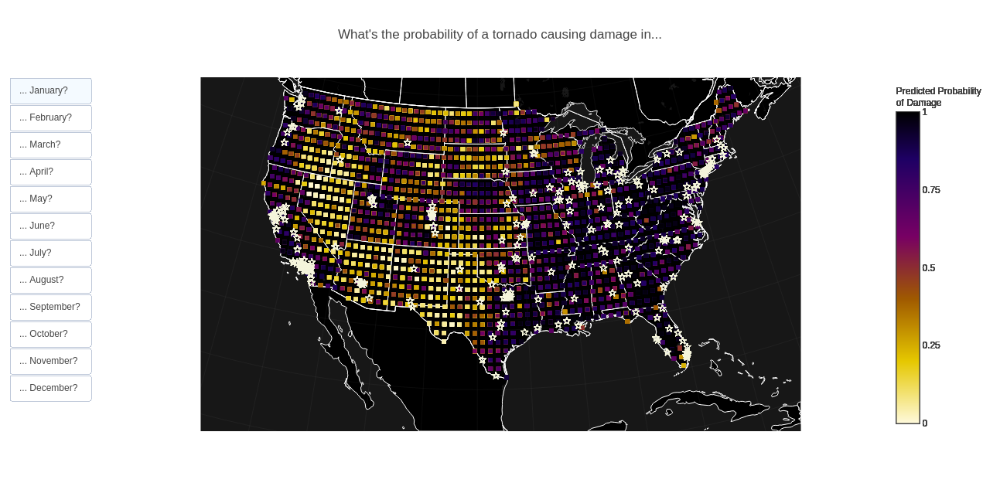

In [21]:
# Each trace can be thought of as a layer to the map
# trace1-12 are monthly data points
trace1 = {"lon": grid_jan_data["BEGIN_LON"],
          "lat":  grid_jan_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jan_data["DAMAGE_PROB"],
          "marker": {"color": grid_jan_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace2 = {"lon": grid_feb_data["BEGIN_LON"],
          "lat":  grid_feb_data["BEGIN_LAT"], 
          "name": "Grid Point",
          "text": grid_feb_data["DAMAGE_PROB"],
          "marker": {"color": grid_feb_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace3 = {"lon": grid_mar_data["BEGIN_LON"],
          "lat":  grid_mar_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_mar_data["DAMAGE_PROB"],
          "marker": {"color": grid_mar_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace4 = {"lon": grid_apr_data["BEGIN_LON"],
          "lat":  grid_apr_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_apr_data["DAMAGE_PROB"],
          "marker": {"color": grid_apr_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace5 = {"lon": grid_may_data["BEGIN_LON"],
          "lat":  grid_may_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_may_data["DAMAGE_PROB"],
          "marker": {"color": grid_may_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace6 = {"lon": grid_jun_data["BEGIN_LON"],
          "lat":  grid_jun_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jun_data["DAMAGE_PROB"],
          "marker": {"color": grid_jun_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace7 = {"lon": grid_jul_data["BEGIN_LON"],
          "lat":  grid_jul_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_jul_data["DAMAGE_PROB"],
          "marker": {"color": grid_jul_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace8 = {"lon": grid_aug_data["BEGIN_LON"],
          "lat":  grid_aug_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_aug_data["DAMAGE_PROB"], 
          "marker": {"color": grid_aug_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace9 = {"lon": grid_sep_data["BEGIN_LON"],
          "lat":  grid_sep_data["BEGIN_LAT"],
          "name": "Grid Point",
          "text": grid_sep_data["DAMAGE_PROB"],
          "marker": {"color": grid_sep_data["DAMAGE_PROB"],
                     "colorscale": "Electric",
                     "reversescale": True,
                     "size": 5.5,
                     "symbol":"square",
                     "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                     "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
          "type": "scattergeo", 
          "visible": True}
trace10 = {"lon": grid_oct_data["BEGIN_LON"],
           "lat":  grid_oct_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_oct_data["DAMAGE_PROB"],
           "marker": {"color": grid_oct_data["DAMAGE_PROB"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                      "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
           "type": "scattergeo", 
           "visible": True}
trace11 = {"lon": grid_nov_data["BEGIN_LON"],
           "lat":  grid_nov_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_nov_data["DAMAGE_PROB"],
           "marker": {"color": grid_nov_data["DAMAGE_PROB"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                      "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
           "type": "scattergeo", 
           "visible": True}
trace12 = {"lon": grid_dec_data["BEGIN_LON"],
           "lat":  grid_dec_data["BEGIN_LAT"],
           "name": "Grid Point",
           "text": grid_dec_data["DAMAGE_PROB"],
           "marker": {"color": grid_dec_data["DAMAGE_PROB"],
                      "colorscale": "Electric",
                     "reversescale": True,
                      "size": 5.5,
                      "symbol":"square",
                      "cmin": grid_pred_val_2019['DAMAGE_PROB'].min(),
                      "cmax": grid_pred_val_2019['DAMAGE_PROB'].max(),
                     "colorbar": dict(title = 'Predicted Probability<br>of Damage',
                                      tickmode = 'array',
                                      tickvals = [0, 0.25, 0.5, 0.75, 1])},
           "type": "scattergeo", 
           "visible": True}


# trace13-24 are identical and are the cities
# They are repeated so that they can be redrawn for each dropdown selection
# Otherwise they become background to the prediction points
# And therefore less visible
trace13 = {"lon": cities_jan_data["BEGIN_LON"],
           "lat": cities_jan_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jan_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace14 = {"lon": cities_feb_data["BEGIN_LON"],
           "lat": cities_feb_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_feb_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace15 = {"lon": cities_mar_data["BEGIN_LON"],
           "lat": cities_mar_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_mar_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace16 = {"lon": cities_apr_data["BEGIN_LON"],
           "lat": cities_apr_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_apr_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace17 = {"lon": cities_may_data["BEGIN_LON"],
           "lat": cities_may_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_may_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace18 = {"lon": cities_jun_data["BEGIN_LON"],
           "lat": cities_jun_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jun_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace19 = {"lon": cities_jul_data["BEGIN_LON"],
           "lat": cities_jul_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_jul_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace20 = {"lon": cities_aug_data["BEGIN_LON"],
           "lat": cities_aug_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_aug_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace21 = {"lon": cities_sep_data["BEGIN_LON"],
           "lat": cities_sep_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_sep_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace22 = {"lon": cities_oct_data["BEGIN_LON"],
           "lat": cities_oct_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_oct_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace23 = {"lon": cities_nov_data["BEGIN_LON"],
           "lat": cities_nov_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_nov_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}
trace24 = {"lon": cities_dec_data["BEGIN_LON"],
           "lat": cities_dec_data["BEGIN_LAT"],
           "name": "City",
           "text": cities_dec_data["DAMAGE_PROB"],
           "marker": {"size": 7,
                      "symbol": "star-open",
                      "color": "beige"},
           "type": "scattergeo"}


# Acknowledge all the traces as a the map data
data2 = Data([trace1, trace2, trace3, trace4,
              trace5, trace6, trace7, trace8,
              trace9, trace10, trace11, trace12,
              trace13, trace14, trace15, trace16,
              trace17, trace18, trace19, trace20,
              trace21, trace22, trace23, trace24])


# Design the layout/background
layout2 = dict(geo = dict(scope = 'north america',
                          showland = True,
                          landcolor = "rgb(0, 0, 0)",
                          subunitcolor = "rgb(255, 255, 255)",
                          countrycolor = "rgb(255, 255, 255)",
                          showlakes = True,
                          showocean = True,
                          lakecolor = "rgb(23, 23, 23)",
                          oceancolor = "rgb(23, 23, 23)",
                          showsubunits = True,
                          showcountries = True,
                          resolution = 50,
                          lonaxis = dict(showgrid = True,
                                         gridwidth = 0.05,
                                         range= [-125.0, -70.0],
                                         dtick = 5),
                          lataxis = dict(showgrid = True,
                                         gridwidth = 0.05,
                                         range= [23.0, 50.0],
                                         dtick = 5)),
               title = "What's the probability of a tornado causing damage in...",
               showlegend = False,
               autosize = False,
               height = 637.5, width = 825)


# Set up the dropdown selections
updatemenus = [{'buttons': [{'args': ['visible', [True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': '... January?',
                             'method': 'restyle'},
                            {'args': ['visible', [False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': '... February?',
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': "... March?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False]],
                             'label': "... April?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False]],
                             'label': "... May?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False]],
                             'label': "... June?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False]],
                             'label': "... July?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False]],
                             'label': "... August?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  True, False, False, False]],
                             'label': "... September?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, True, False, False]],
                             'label': "... October?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, True, False]],
                             'label': "... November?",
                             'method': 'restyle'},
                            {'args': ['visible', [False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True,
                                                  False, False, False, False,
                                                  False, False, False, False,
                                                  False, False, False, True]],
                             'label': "... December?",
                             'method': 'restyle'}],
               'type': 'buttons'}]


# Add those dropdown selections to the layout information
layout2['updatemenus'] = updatemenus


# Make the figure
fig2 = {'data':data2,
       'layout':layout2}


# Plot the figure
plotly.offline.iplot(fig2)